# **Wearable Data-Triggered Smart Home Temperature Automation System to Promote Sleep Quality**
Name: Meixi Lu

Course No.: CS 497

</br>

# **Introduction**
### **Bad Sleep Quality**
Approximately 50 to 70 million Americans suffer from sleep disorders, and one in three adults (about 84 million) do not regularly achieve the recommended amount of uninterrupted sleep.

### **Room Temperature**
A 2012 study identified room temperature as a critical factor in achieving quality sleep. Excessively high or low ambient temperatures may affect sleep even in individuals without insomnia.

### **Smart Home Automation**
Smart home automation systems are increasingly being used to improve people's life quality.

### **Objective**

Develop a non-intrusive and ubiquitous smart temperature-adjusting system to improve sleep quality in healthy individuals. The system make interventions based on user's wearable health data and machine learning.

Mark Weiser Ubiquitous Computing
<img src="https://drive.google.com/uc?id=1-g6EwMhYeqeMO-1XBHOoRSEGbhRXE2qN" alt="drawing" width="700"/>

</br>

# **Related Work**
## **Existing product?**
Current smart home products, such as Apple HomeKit, Google Assistant, and Amazon Alexa, allow users to schedule and experiment with different temperatures.

(1) Many wearbles only collect data but do not make interventions.

(2) Many users **lack the knowledge** to effectively adjust the temperature to suit their sleep needs.

(3) While data-driven devices like the **Nest Learning Thermostat** and Ecobee Smart Thermostat automatically adjust temperature, their primary focus remains on enhancing energy efficiency and convenience based on user schedules. Importantly, **they do not utilize individual health data as input for their predictions.**

(4) To date, there has been limited research on smart home automation that utilizes the owner's physiological state. The most relevant research explores the possibility of using EEG (electroencephalography) signals to control appliances.


## **What is a good sleep quality?**
- Sleep efficiency: **total sleep time** / total time in bed (including non-sleep-related activities such as reading or watching television before sleep and after waking)
- Sleep latency: **the time it takes to fall asleep after "lights out"**
- Sleep duration: **total sleep time**
- Wake after sleep onset: **Wake up time, some researches suggest it can also be sleep disorder movement like sleep walk, or frequent adjustments**

Therefore, to achieve better sleep quality, we need to
1. **Longer total sleep time**
2. **Shorter time it takes to fall asleep after “lights out”**
3. **Fewer awakenings**

</br>

# **Method & Experiment**
## **Goal**
(1) Find the correlation between ambient temperature and restlessness movement during the night.

(2) Find the temperature at the target user has the least awakenings or less frequent movements.

## **Details**

### 1. Individual:
One
### 2. Population:
Healthy
### 3. Duration:
2 days
### 4. Ambient Temperatures
First day: 82 degree F(Natural Temperature), Second day: 65 degree F(AC)
### 5. Analysis type
Same-day analysis, Day-to-day analysis
### 6. Confounders
We will control for potential confounders that could impact sleep quality.

(1) Lifestyle Factors: Stress levels, physical activity, and screen time will be kept relatively consistent by conducting experiments on weekends.

(2) Sleep Hygiene: Participants will adhere to a consistent bedtime. (Sleep time: around 2:19 am)

(3) Diet: Same caffeine and no alcohol intake during the study period.

(4) Environmental Noise: Sleep in the same room to ensure consistency.

(5) Clothing and Bedding: Same across experiment days.
### 7. Device
IMU,  Seeed nRF52840, Seeed nRF52840 Extension board, LiPo 3.7V 500mAH battery (JST connector)

Ambient Temperature: Thermostat on the Microcontroller

Movement: IMU

### 8. Wearing position
Wrist

<img src="https://drive.google.com/uc?id=1c8acSG7jsvzMIEH-vXhwegTTB85iZ5Bq" alt="drawing" width="300"/>

<img src="https://drive.google.com/uc?id=1KPhi0x1HfTeHyCHKI1COCX_i5oWhIblK" alt="drawing" width="700"/>




# **Result Analysis**

## Same Day analysis

In [ ]:
#@title 1. Load data
from google.colab import drive
drive.mount('/content/drive')

import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
db_path = '/content/drive/MyDrive/mHealth/day1.csv'
df = pd.read_csv(db_path)
df = df.drop(columns=['time_ms'])

# Please enter below manually because our sensor's RTC module is not working properlly
START_TIME='02:19:00'
END_TIME='06:00:00'

df.head(1)

Mounted at /content/drive


,time,accel_x,accel_y,accel_z,gyr_x,gyr_y,gyr_z,temp_c,temp_f
0,8:47:6,0.37,-0.19,0.96,0.7,-2.31,-0.56,30.47,86.84


In [ ]:
#@title 2. Feature Engineering
def get_l2(df):
    # Get l2 accel and l2 gyr
    df['l2_accel'] = np.sqrt(np.square(df['accel_x']) + np.square(df['accel_y']) + np.square(df['accel_z']))
    df['l2_gyr'] = np.sqrt(np.square(df['gyr_x']) + np.square(df['gyr_y']) + np.square(df['gyr_z']))

    # Get a combined metric for both l2 accel and l2 gyr
    scaler = MinMaxScaler()
    df[['l2_accel_scaled', 'l2_gyr_scaled']] = scaler.fit_transform(df[['l2_accel', 'l2_gyr']])
    df['l2_combined_movement'] = np.sqrt(df['l2_accel_scaled']**2 + df['l2_gyr_scaled']**2)
    return df

df = get_l2(df)
# df.head(1)

In [ ]:
#@title 3. Aggregation (1s)
def window_size_df(df, window_size, step_size):
    df_windowed = df.rolling(window=window_size).agg({
        'l2_accel': ['max', 'mean'],
        'l2_gyr': ['max', 'mean'],
        'l2_combined_movement': ['mean'],
        'temp_f': ['mean']
    }).dropna()

    df_windowed.reset_index(drop=True, inplace=True)
    df_windowed = df_windowed.iloc[window_size - 1::step_size]
    df_windowed.columns = ['_'.join(col).strip() for col in df_windowed.columns.values]

    # Add time column
    start_time = pd.Timestamp(START_TIME)
    end_time = pd.Timestamp(END_TIME)
    total_seconds = (end_time - start_time).total_seconds()
    interval_seconds = round(max(0.01, total_seconds / len(df_windowed)),2)
    time_range = pd.date_range(start=start_time, periods=len(df_windowed), freq=pd.to_timedelta(interval_seconds, unit='s'))
    df_windowed['Time'] = time_range.strftime('%H:%M:%S')

    default_date = pd.Timestamp('today').date()  # Get today's date as a date object
    df_windowed['DateTime'] = pd.to_datetime(str(default_date) + ' ' + df_windowed['Time'].astype(str))

    return df_windowed

df_windowed = window_size_df(df, window_size=100, step_size=100)



We want to know about the movement during sleep. We only care about the magnitude and we do not need rotation

## Features

### 1. L2 Norm(Accelerometer)
### 2. L2 Norm(Gyroscope)

### **Combined Movement =  L2 Norm(Scaled(L2_norm_accel), Scaled(L2_norm_gyro))**

## Overall trend

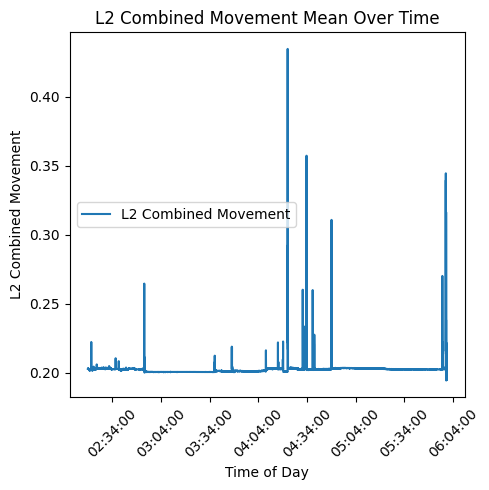

<Figure size 640x480 with 0 Axes>

In [ ]:
#@title 1. Movement
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
import pandas as pd

plt.figure(figsize=(5, 5))
plt.plot(df_windowed['DateTime'], df_windowed['l2_combined_movement_mean'], label='L2 Combined Movement')
plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=30))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.xticks(rotation=45)
plt.xlabel('Time of Day')
plt.ylabel('L2 Combined Movement')
plt.title('L2 Combined Movement Mean Over Time')
plt.legend()
plt.tight_layout()
plt.show()

# # First, ensure 'Time' is a datetime object if it's not already
# df_windowed['TimeString'] = df_windowed['Time'].apply(lambda t: t.strftime('%H:%M:%S'))

# plt.figure(figsize=(15, 10))

# # tick_positions = range(0, len(df_windowed['TimeString']), 100)
# # tick_labels = [df_windowed['TimeString'][i] for i in tick_positions]

# # Plot L2 norm of the combined movement
# plt.subplot(2, 3, 1)
# plt.plot(df_windowed['l2_combined_movement_mean'], label='L2 Combined Movement', color='red')
# plt.title('L2 Norm of Combined Movement')
# plt.xlabel('Sample Index')
# plt.xticks(tick_positions, tick_labels, rotation=45)
# plt.ylabel('L2 Combined Movement')
# plt.legend()

# # Plot L2 norm of the accelerometer data
# plt.subplot(2, 3, 2)
# plt.plot(df_windowed.index, df_windowed['l2_accel_mean'], label='L2 Norm Accel')
# plt.title('L2 Norm of Accelerometer Data')
# plt.xlabel('Sample Index')
# plt.xticks(rotation=45)
# plt.ylabel('L2 Norm Accel')
# plt.legend()

# # Plot L2 norm of the gyroscope data
# plt.subplot(2, 3, 3)
# plt.plot(df_windowed.index, df_windowed['l2_gyr_mean'], label='L2 Norm Gyr', color='green')
# plt.title('L2 Norm of Gyroscope Data')
# plt.xlabel('Sample Index')
# plt.xticks(rotation=45)
# plt.ylabel('L2 Norm Gy')
# plt.legend()

# Plot L2 norm of the gyroscope data
# plt.subplot(2, 3, 4)
# plt.plot(df_windowed['l2_accel_changes'], label='L2 Accel changes', color='green')
# plt.title('L2 Norm of Accel changes')
# plt.xlabel('Sample Index')
# plt.xticks(rotation=45)
# plt.ylabel('L2 Accel changes')
# plt.legend()

# # Plot L2 norm of the gyroscope data
# plt.subplot(2, 3, 5)
# plt.plot(df_windowed['l2_gyr_changes'], label='L2 Gyr changes', color='green')
# plt.title('L2 Norm of Gyr changes')
# plt.xlabel('Sample Index')
# plt.xticks(rotation=45)
# plt.ylabel('L2 Gyr changes')
# plt.legend()

plt.tight_layout()
plt.show()

Flat: Static

Glitches: Movement

In [ ]:
#@title Ranges
df_windowed.describe()[['l2_accel_mean', 'l2_gyr_mean', 'l2_combined_movement_mean', 'temp_f_mean']].loc[['mean', 'min', 'max', 'std']]

,l2_accel_mean,l2_gyr_mean,l2_combined_movement_mean,temp_f_mean
mean,1.041363,2.908343,0.202490,82.971254
min,0.984477,1.951196,0.194475,79.110900
max,1.139025,198.424984,0.434541,86.867100
std,0.004538,5.872492,0.005336,2.630397


Gyroscope: 0 - 200

Accelerometer: Not change much

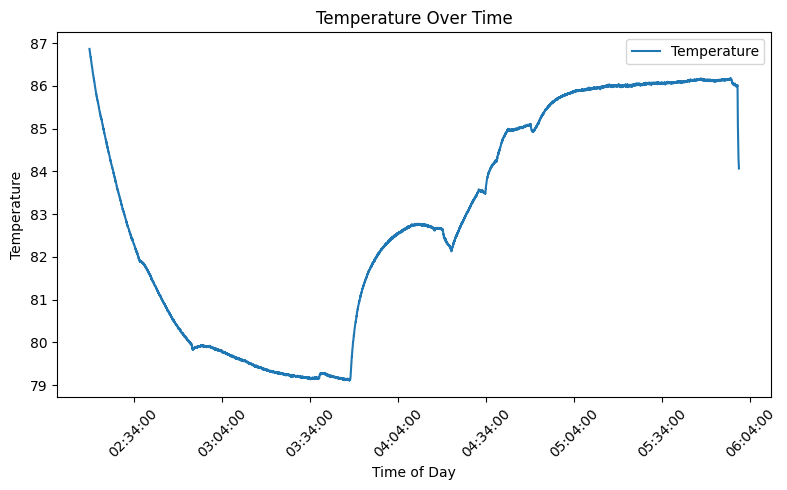

In [ ]:
#@title 2. Temperature
plt.figure(figsize=(8, 5))
plt.plot(df_windowed['DateTime'], df_windowed['temp_f_mean'], label='Temperature')

plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=30))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))

plt.title('Temperature Over Time')
plt.xticks(rotation=45)
plt.xlabel('Time of Day')
plt.ylabel('Temperature')

plt.legend()
plt.tight_layout()
plt.show()

Temperature: 79-87

# Movement in Details



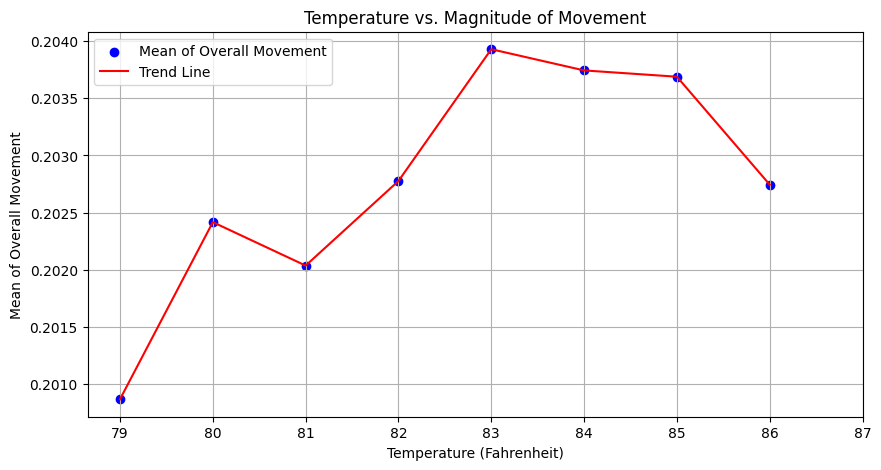

In [ ]:
#@title Temperature vs. Magnitude of Movement
import matplotlib.pyplot as plt
import pandas as pd
import math

def plot_average_movement_with_temp(content, y_label, title):
    low_temp = math.floor(df_windowed['temp_f_mean'].min())
    high_temp = math.ceil(df_windowed['temp_f_mean'].max())

    bins = list(range(low_temp, high_temp + 1))
    df_windowed['temp_f_mean_binned'] = pd.cut(df_windowed['temp_f_mean'], bins=bins, right=False, labels=range(low_temp, high_temp))

    grouped = df_windowed.groupby('temp_f_mean_binned', observed=False)[content].mean().reset_index()

    grouped['temp_f_mean_binned'] = grouped['temp_f_mean_binned'].astype(int)

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.scatter(grouped['temp_f_mean_binned'], grouped[content], color='blue', label=y_label)
    plt.plot(grouped['temp_f_mean_binned'], grouped[content], color='red', label='Trend Line')  # Line plot
    plt.xticks(bins)
    plt.xlabel('Temperature (Fahrenheit)')
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_average_movement_with_temp('l2_combined_movement_mean', y_label='Mean of Overall Movement', title='Temperature vs. Magnitude of Movement')

Movements become more as temperature goes up. At 83 F, I move the most in terms of the average magnitude of movement.

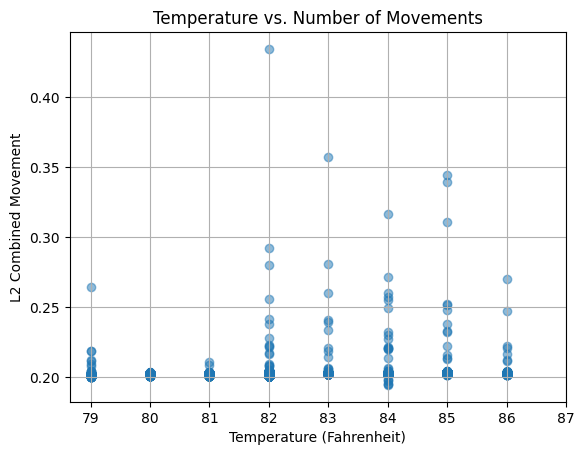

In [ ]:
#@title Temperature vs. Number of Movements
def plot_number_movement_with_temp(content, y_label, title):
    low_temp = math.floor(df_windowed['temp_f_mean'].min())
    high_temp = math.ceil(df_windowed['temp_f_mean'].max())
    bins = list(range(low_temp, high_temp+1))
    df_windowed['temp_f_mean_binned'] = pd.cut(df_windowed['temp_f_mean'], bins=bins, right=False, labels=range(low_temp, high_temp))

    grouped = df_windowed.groupby('temp_f_mean_binned', observed=False)[content].mean().reset_index()

    grouped['temp_f_mean_binned'] = grouped['temp_f_mean_binned'].astype(int)

    plt.scatter(df_windowed['temp_f_mean_binned'], df_windowed[content], alpha=0.5)  # alpha for better visualization of point density
    plt.xticks(bins)
    plt.xlabel('Temperature (Fahrenheit)')
    plt.ylabel(y_label)
    plt.title(title)
    plt.grid(True)
    plt.show()

plot_number_movement_with_temp('l2_combined_movement_mean', y_label='L2 Combined Movement', title='Temperature vs. Number of Movements')

## Threshold for restlessness movement
Restlessness during sleep typically refers to frequent or significant physical movements that interrupt the normal sleep cycle.

In [ ]:
#@title **1. Sitting up**
sit_up_df_path = '/content/drive/MyDrive/mHealth/sittingup.csv'
sit_up_df = pd.read_csv(sit_up_df_path)
sit_up_df = sit_up_df.drop(columns=['time_ms'])
sit_up_df = get_l2(sit_up_df)
sit_up_df_windowed = window_size_df(sit_up_df, 10, 10) # 1s
# print(f"Mean of l2_accel is {sit_up_df_windowed['l2_accel_mean'].mean():.2f}, Mean if l2_gyr is {sit_up_df_windowed['l2_gyr_mean'].mean():.2f}, Mean of Combined Movement is {sit_up_df_windowed['l2_combined_movement_mean'].mean():.2f}")
# sit_up_df_windowed.head()

In [ ]:
#@title example video
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width = 500):

  video_file = open(video_path, "r+b").read()

  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

video_path = "/content/drive/MyDrive/mHealth/sittingup480.mov"
show_video(video_path)

In [ ]:
#@title **2. Leave the bed**
leave_the_bed_df_path = '/content/drive/MyDrive/mHealth/leavethebed.csv'
leave_the_bed_df = pd.read_csv(leave_the_bed_df_path)
leave_the_bed_df = leave_the_bed_df.drop(columns=['time_ms'])
leave_the_bed_df = get_l2(leave_the_bed_df)
leave_the_bed_df_windowed = window_size_df(leave_the_bed_df, 10, 10) # 1s
# print(f"Mean of l2_accel is {leave_the_bed_df_windowed['l2_accel_mean'].mean():.2f}, Mean if l2_gyr is {leave_the_bed_df_windowed['l2_gyr_mean'].mean():.2f}, Mean of Combined Movement is {leave_the_bed_df_windowed['l2_combined_movement_mean'].mean():.2f}")
# leave_the_bed_df_windowed.head()

In [ ]:
#@title example video
video_path = "/content/drive/MyDrive/mHealth/leavethebed480.mov"
show_video(video_path)

In [ ]:
#@title **3. Turning, Tossing, Frequent Shifts and Adjustments**
turning_df_path = '/content/drive/MyDrive/mHealth/turning&tossing.csv'
turning_df = pd.read_csv(turning_df_path)
turning_df = turning_df.drop(columns=['time_ms'])
turning_df = get_l2(turning_df)
turning_df_windowed = window_size_df(turning_df, 10, 10) # 1s
# print(f"Mean of l2_accel is {turning_df_windowed['l2_accel_mean'].mean():.2f}, Mean if l2_gyr is {turning_df_windowed['l2_gyr_mean'].mean():.2f}, Mean of Combined Movement is {turning_df_windowed['l2_combined_movement_mean'].mean():.2f}")
# turning_df_windowed.head()

In [ ]:
#@title example video
video_path = "/content/drive/MyDrive/mHealth/turning&tossing480.mov"
show_video(video_path)

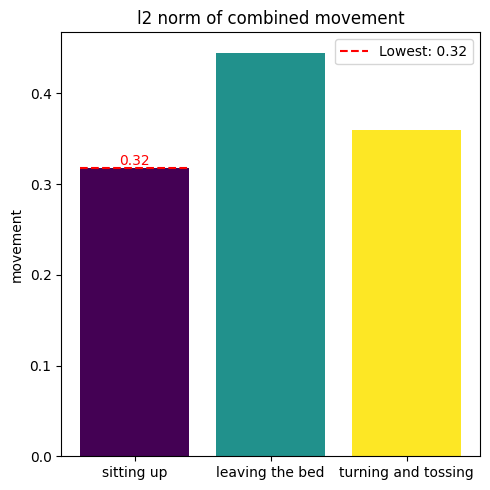

In [ ]:
#@title Find the threshold
l2_accel_threshold_candidate_list = [sit_up_df_windowed['l2_accel_mean'].mean(), leave_the_bed_df_windowed['l2_accel_mean'].mean(), turning_df_windowed['l2_accel_mean'].mean()]
l2_gyr_threshold_candidate_list = [sit_up_df_windowed['l2_gyr_mean'].mean(), leave_the_bed_df_windowed['l2_gyr_mean'].mean(), turning_df_windowed['l2_gyr_mean'].mean()]
l2_combined_movement_threshold_candidate_list = [sit_up_df_windowed['l2_combined_movement_mean'].mean(), leave_the_bed_df_windowed['l2_combined_movement_mean'].mean(), turning_df_windowed['l2_combined_movement_mean'].mean()]
movement = ['sitting up', 'leaving the bed', 'turning and tossing']

def plot_thresholds(l2_accel_list, l2_gyr_list, l2_combined_list, movement, plot_all=True):
    colors1 = plt.cm.viridis(np.linspace(0, 1, len(movement)))

    if plot_all:
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

        ax1.bar(movement, l2_accel_threshold_candidate_list, color=colors1)
        ax1.set_title('l2 norm of accelerometer')
        ax1.set_ylabel('movement')

        ax2.bar(movement, l2_gyr_threshold_candidate_list, color=colors1)
        ax2.set_title('l2 norm of gyroscope')
        ax2.set_ylabel('movement')

        ax3.bar(movement, l2_combined_movement_threshold_candidate_list, color=colors1)
        ax3.set_title('l2 norm of combined movement')
        ax3.set_ylabel('movement')

        axes = [ax1, ax2, ax3]
        min_vals = [min(l2_accel_list), min(l2_gyr_list), min(l2_combined_list)]
        min_idxs = [l2_accel_list.index(min(l2_accel_list)), l2_gyr_list.index(min(l2_gyr_list)), l2_combined_list.index(min(l2_combined_list))]
        threshold_lists = [l2_accel_list, l2_gyr_list, l2_combined_list]

    else:
        fig, ax = plt.subplots(figsize=(5, 5))

        # Combined movement subplot only
        ax.bar(movement, l2_combined_list, color=colors1)
        ax.set_title('l2 norm of combined movement')
        ax.set_ylabel('movement')

        axes = [ax]
        min_vals = [min(l2_combined_list)]
        min_idxs = [l2_combined_list.index(min(l2_combined_list))]
        threshold_lists = [l2_combined_list]

    # Draw lines and annotate minimum values
    for ax, min_val, min_idx, threshold_list in zip(axes, min_vals, min_idxs, threshold_lists):
        ax.hlines(min_val, min_idx - 0.4, min_idx + 0.4, color='red', linestyle='--', label=f'Lowest: {min_val:.2f}')
        ax.text(min_idx, min_val, f'{min_val:.2f}', ha='center', va='bottom', color='red')
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_thresholds(l2_accel_threshold_candidate_list, l2_gyr_threshold_candidate_list, l2_combined_movement_threshold_candidate_list, movement, plot_all=False)


### Threshold: Combined movement: 0.32

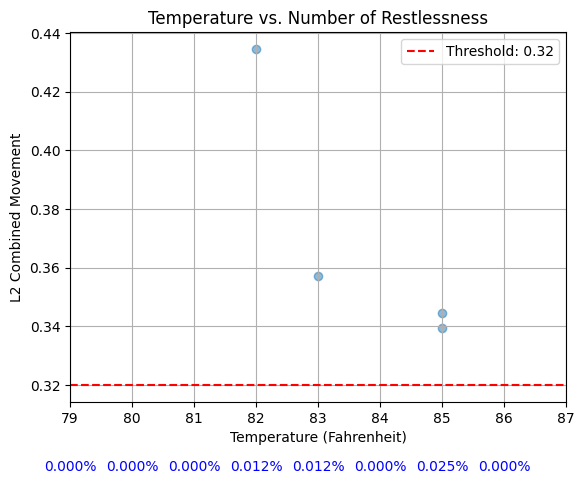

In [ ]:
#@title Temperature vs. Number of Restlessness
def plot_number_movement_with_threshold(content, y_label, title, threshold):
    low_temp = math.floor(df_windowed['temp_f_mean'].min())
    high_temp = math.ceil(df_windowed['temp_f_mean'].max())
    bins = list(range(low_temp, high_temp+1))
    df_windowed['temp_f_mean_binned'] = pd.cut(df_windowed['temp_f_mean'], bins=bins, right=False, labels=range(low_temp, high_temp))

    grouped = df_windowed.groupby('temp_f_mean_binned', observed=False)[content].mean().reset_index()

    grouped['temp_f_mean_binned'] = grouped['temp_f_mean_binned'].astype(int)

    filtered_data = df_windowed[df_windowed[content] > threshold]

    plt.scatter(filtered_data['temp_f_mean_binned'], filtered_data[content], alpha=0.5)  # alpha for better visualization of point density
    plt.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold: {threshold}')
    plt.xticks(bins)
    plt.xlabel('Temperature (Fahrenheit)')
    plt.ylabel(y_label)
    plt.title(title)

    # Calculate and annotate the percentage of data points above the threshold in each bin
    total_counts = df_windowed['temp_f_mean_binned'].value_counts().sort_index()
    above_threshold_counts = filtered_data['temp_f_mean_binned'].value_counts().sort_index()
    for bin_label in total_counts.index:
        if bin_label in above_threshold_counts.index:
            percentage = (above_threshold_counts[bin_label] / len(df_windowed)) * 100
            plt.text(bin_label, threshold - (threshold * 0.08), f'{percentage:.3f}%', ha='center', va='top', color='blue')
        else:
            plt.text(bin_label, threshold - (threshold * 0.08), '0%', ha='center', va='top', color='blue')

    plt.legend()
    plt.grid(True)
    plt.show()

threshold_map = {'l2_combined_movement_mean': 0.32, 'l2_accel_mean': 1.02, 'l2_gyr_mean': 82.7}
plot_number_movement_with_threshold('l2_combined_movement_mean', y_label='L2 Combined Movement', title='Temperature vs. Number of Restlessness', threshold=threshold_map['l2_combined_movement_mean'])

Therefore, xx degree cause fewer movement and

# Correlation: Temperature vs Restlessness

Correlation Coefficient
Calculate the Pearson correlation coefficient to quantify the degree of linear relationship between the variables.

In [ ]:
#@title Pearson correlation
import pandas as pd
import scipy.stats

def print_correlations_and_pvalues(df, variable):
    for col in ['l2_combined_movement_mean']:
        if col != variable:
            corr, p_value = scipy.stats.pearsonr(df[variable], df[col])
            print(f"Pearson correlation between {variable} and {col}: {corr:.3f}, p-value: {p_value:.3g}")

print_correlations_and_pvalues(df_windowed, 'temp_f_mean')

Pearson correlation between temp_f_mean and l2_combined_movement_mean: 0.162, p-value: 6.79e-49


No linear correlation between temperature and restless movement.

In [ ]:
#@title Spearman correlation
import pandas as pd
import scipy.stats

def print_spearman_correlations_and_pvalues(df, variable):
    for col in ['l2_combined_movement_mean']:
        if col != variable:
            corr, p_value = scipy.stats.spearmanr(df[variable], df[col])
            print(f"Spearman correlation between {variable} and {col}: {corr:.3f}, p-value: {p_value:.3g}")

print_spearman_correlations_and_pvalues(df_windowed, 'temp_f_mean')

Spearman correlation between temp_f_mean and l2_combined_movement_mean: 0.605, p-value: 0


Non-linear correlation. As the temperature gets higher, there are more restlessness movements.

# Day 2: 65 F Air Conditioned

In [ ]:
#@title Load data
day2_path = '/content/drive/MyDrive/mHealth/day2.csv'
day2_df = pd.read_csv(day2_path)
day2_df = day2_df.drop(columns=['time_ms']).copy()
day2_df = get_l2(day2_df)
START_TIME='02:19:00'
END_TIME='06:00:00'
day2_df_windowed = window_size_df(day2_df, 100, 100)

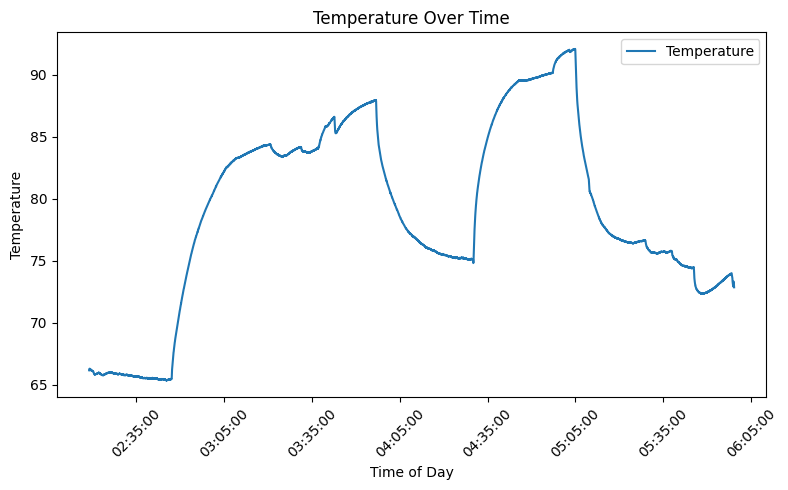

In [ ]:
#@title 2. Temperature
plt.figure(figsize=(8, 5))
plt.plot(day2_df_windowed['DateTime'], day2_df_windowed['temp_f_mean'], label='Temperature')

plt.gca().xaxis.set_major_locator(mdates.MinuteLocator(interval=30))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))

plt.title('Temperature Over Time')
plt.xticks(rotation=45)
plt.xlabel('Time of Day')
plt.ylabel('Temperature')

plt.legend()
plt.tight_layout()
plt.show()

1. Cover by the bedding.
2. Microcontroller heat up by bedding.

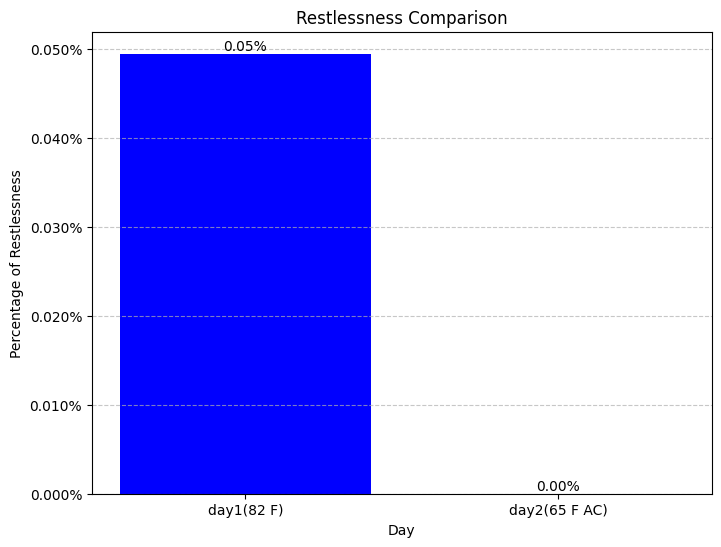

In [ ]:
#@title Restlessness Comparison
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

threshold = 0.32
day1_filtered_percentage = len(df_windowed[df_windowed['l2_combined_movement_mean'] > threshold]) / len(df_windowed)
day2_filtered_percentage = len(day2_df_windowed[day2_df_windowed['l2_combined_movement_mean'] > threshold]) / len(day2_df_windowed)

plt.figure(figsize=(8, 6))
plt.bar(['day1(82 F)', 'day2(65 F AC)'], [day1_filtered_percentage, day2_filtered_percentage], color=['blue', 'green'])
plt.xlabel('Day')
plt.ylabel('Percentage of Restlessness')
plt.title('Restlessness Comparison')

# Annotate each bar with the y value as a percentage
for i, value in enumerate([day1_filtered_percentage, day2_filtered_percentage]):
    plt.text(i, value, f'{value:.2%}', ha='center', va='bottom', color='black')  # Adjusted y position

# Set y-axis to percentage format
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Higher temperature has more movements.

# Future improvement
1. The **temperature changes** may affect sleep quality as well.
Solution: Conduct experiments when both days have constant temperature.

2. **Thermostat should be separate** from the IMU wrist band.

3. While external factors are controlled and studied, Human's **internal sleep cycle** should be taken into consideration. During Deep sleep stage, people can be less affected and less sensitive to the ambient temperature anyway.

4. **2 days are not enough**.

5. **More participants** should be involved in the experiments, especially people of  different ages.

6. Experiment is better to done in **a lab setting** to make sure the participants can stick to the confounders as much as possible.